In [73]:
using Sockets
using CUDA
using PulsePropagation
using CSV
using DelimitedFiles
using NPZ
using FFTW
using LinearAlgebra
using Arpack
using JLD2

println("Host: ", gethostname())
println("Slurm job: ", get(ENV, "SLURM_JOB_ID", "missing"))
println("GPU: ", CUDA.name(CUDA.device()))
println("CUDA functional: ", CUDA.functional())

Host: c0003
Slurm job: 235987
GPU: NVIDIA H100 80GB HBM3
CUDA functional: true


In [74]:
ENV["GKSwstype"] = "100"

using Plots
Plots.gr()

Plots.GRBackend()

In [75]:
c_light = 2.99792458e-4; # m/ps -- see manual for unit system info
Nt = 2^14;
time_window = 100; # ps
λ0 = 1550e-9; # m
ω0 = 2*π*c_light/λ0;

time_grid = TimeGrid(Nt,time_window);
t = time_axis(time_grid);
Ω = frequency_axis(time_grid); # constructs relative frequency
ω = ω0 .+ Ω; # absolute frequency;
λ = wavelength_axis(time_grid,ω0); # wavelength
λ_nm = 1e9 * λ;

dofs = degrees_of_freedom(:time, :space)
domain = MMGNLSEDomain(dofs, time_grid);

In [76]:
core_radius = 52.5e-6;
NA = 0.275;
material = Silica() # The default Silica picks an anisotropic Raman model. See other notebooks such as soliton_jitter for other Raman models;
grin_fiber = GRIN(λ0, core_radius, NA);

num_groups = 14;
num_modes = Int((num_groups)*(num_groups+1)/2);

properties = compute_fiber_properties(grin_fiber, material, num_modes, polarization=:scalar, mode_basis=:LP, beta_order=3, overlap_representation=:quadrature_cp,
    overlap_quadrature_order=128, grid_half_width=1.3*core_radius,
    grid_size=256)

FiberProperties{TaylorBeta{Float64, 2}, MMGNLSECPDecomposition{Float64, Float64}, AnisotropicRaman{Float64}, FiberModeData{Float64, Float64, Vector{NamedTuple}}, @NamedTuple{profile::Symbol, material::Symbol, lambda0::Float64, core_radius::Float64, NA::Float64, num_modes::Int64, polarization::Symbol, mode_basis::Symbol, beta_order::Int64, dispersion_span::Float64, dispersion_samples::Int64, dispersion_fit_order::Int64, overlap::@NamedTuple{representation::Symbol, quadrature_order::Int64, chunk_points::Int64, max_workspace_bytes::Int64, precision::Symbol, max_tensor_bytes::Nothing}, wavelength_rule::Symbol, grid::@NamedTuple{nx::Int64, ny::Int64, xmin::Float64, xmax::Float64, ymin::Float64, ymax::Float64}}, Float64}(TaylorBeta{Float64, 2}([5.849963704987068e6 5.846332897825622e6 … 5.802586008202168e6 5.802586008202168e6; 4878.736081105649 4878.777362524257 … 4879.425775995675 4879.425775995675; -0.028030340151547824 -0.02811664663923877 … -0.029419060163149508 -0.029419060163149508; 0.0

In [ ]:
S_compressed = cp_compress(
                properties.S;
                error=1e-3,
                backend=:cuda,
                min_rank=100,       # choose using previous experience
                rank_step=50,       # or 64
                max_rank=6000,
                maxiter=120,
                tolerance=1e-6,
                ridge=1e-8,
                check_every=5,
                )


MMGNLSECPDecomposition{Float64, Float64}([1.2604332480550697e10, 1.1628335417369143e10, 1.3672260628678713e10, 1.1345936585070158e10, 1.2207749736987537e10, 1.1875097563698627e10, 1.2690980311975096e10, 1.3085856626166092e10, 1.342505708345792e10, 1.0359686606175468e10  …  1.1987913882280628e8, 5.720678990880102e7, 5.2012734425095186e7, 5.156848831725995e7, 8.662748608635935e7, 2.0970856341538593e7, 5.150128210933366e7, 4.363935746139437e7, 4.294713422497139e7, 5.287388654725435e7], ([0.22140280851612812 -0.04407473126008361 … 0.010116162284885606 -0.0005609459130856516; -0.2771380951292265 -0.01618711799945028 … -0.006244841609211102 -0.0006516099821240862; … ; 0.1585905856688279 0.01063064612496857 … -0.1963023920688965 0.048397820130055294; -0.09534909082312652 0.08570457141680718 … 0.010956322843632663 -0.22429738458018603], [0.2214084510758031 -0.044074469794834994 … 0.006786645177868525 0.00041789090902102834; -0.2771369590274114 -0.016187250021185484 … -0.003923797588608952 0.00

In [ ]:
coefficients = zeros(ComplexF64, num_modes) 
coefficients[1:20] .= 1.0+0.0im;

initial_field = gaussian_pulse(
        domain,
        num_modes;
        peak_power=3e5,    # total peak power across all modes, W
        fwhm=0.25,          # intensity FWHM, ps
        time_offset=0,  # ps
        coefficients=coefficients,
    );

dz_cp = 50e-6;
length_m = 1;

parameters_compressed = MMGNLSEParameters(
    domain;
    length=length_m,
    beta=properties.beta,
    S=S_compressed,
    n2=material.n2,        # use 0 initially for the linear validation
    omega0=ω0,
    raman=material.raman,
)

solution_cp = solve_mmgnlse(initial_field, parameters_compressed, dz_cp; backend=:cuda_cp_optimized, precision=:mixed,
    adaptive=false)

Aω_0p01 = get_spectral_field(solution_cp);
At_0p01 = get_temporal_field(solution_cp);

In [ ]:
num_ensemble = 120;
ensemble = solve_mmgnlse_stochastic(initial_field, parameters_compressed, dz_cp, num_ensemble;backend=:cuda_cp_optimized, precision=:mixed, noise = 1e6)

MMGNLSEStochasticSolution{Float64, Array{ComplexF64, 5}, MMGNLSEParameters{MMGNLSEDomain{TimeGrid{Float64}, Nothing}, Float64, Array{Int64, 4}, Array{Int64, 4}, TaylorBeta{Float64, 2}, MMGNLSECPDecomposition{Float64, Float64}, Float64, Float64, AnisotropicRaman{Float64}}, @NamedTuple{fano::Array{Float64, 3}, photon_noise::Array{ComplexF64, 4}, weights::Vector{Float64}, seed::Nothing}}([0.0, 1.0], ComplexF64[-5.093630139208521 + 0.23477720082568265im -3.5691110869174807 - 2.398048942611291im … 2.503676547265075 - 4.070301581213935im 1.9793092183568266 - 0.5968409409538209im; 0.6947727704804905 + 1.6376365325104667im 2.0082944214587073 + 1.1216983494499424im … -5.2423976839843185 - 1.6242944930613268im -0.34831449367739803 + 4.068945044341541im; … ; -3.8344309497386213 - 2.798305863945536im -1.183634467760669 - 2.375654375103343im … -2.00497500399465 + 1.8134450893991774im 1.8866742056113026 - 0.4291433512201476im; -4.719007577553139 + 3.3013327020970795im 1.9787956620348837 - 0.61257528

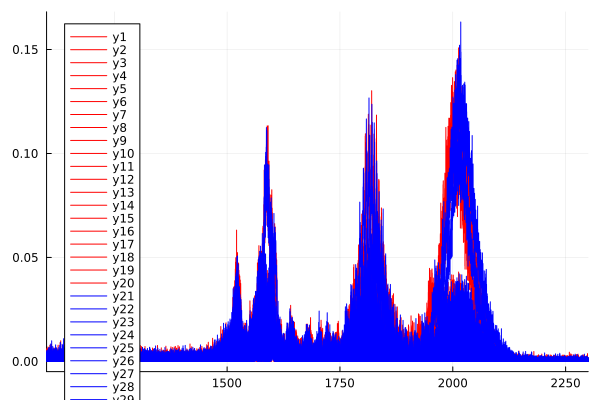

In [139]:
p = plot(λ_nm, abs2.(get_spectral_field(ensemble))[:,1:20,1,1],color=:red)
plot!(λ_nm, abs2.(get_spectral_field(ensemble))[:,1:20,1,3],color=:blue)
xlims!(p, (1100, 2300))
display(p)

In [141]:
JLD2.jldsave(
    "ensemble.jld2";
    ensemble,
    z=ensemble.z,
    fields=ensemble.fields,
    fano=ensemble.noise.fano,
    photon_noise=ensemble.noise.photon_noise,
    weights=ensemble.noise.weights,
)

npzwrite("λ_stochastic.npy",λ_nm)